# Train 1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2, re, sys
import os, fnmatch, shutil, subprocess
from IPython.utils import io
import numpy as np
np.random.seed(1234)
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
#import tensorflow as tf

In [ ]:
#import các thư viện của keras để xây dựng và traing cho model fcn
import tensorflow as tf
import numpy as np
from keras.models import *
from keras.losses import binary_crossentropy
from tensorflow.keras.optimizers import SGD, Adam
from keras.regularizers import l2
from keras.preprocessing.image import ImageDataGenerator
from keras import models
from keras import backend as K
from keras.layers import *
from tensorflow.python.keras.layers import Layer

%cd '/content/drive/MyDrive/MRI_ACDCA/'
from addition_layers import MaxPoolingWithIndices, UpSamplingWithIndices, mvn, standard_block

/content/drive/.shortcut-targets-by-id/1kdKWMtQq063wklZtXKlzGd-nUeOnEiDw/MRI_ACDCA


In [ ]:
x = np.asarray(np.load('/content/drive/MyDrive/MRI_ACDCA/Dataset2/train_image_enpi_crop_128.npy'),np.float32)
y = np.load('/content/drive/MyDrive/MRI_ACDCA/Dataset2/train_label_enpi_crop_128.npy')

#label_endo = tf.where(y == 2.0, 1.0, 0.0)
#label_epi =  tf.where(y == 1.0, 1.0, 0.0) + label_endo

#y[y == 1] = 0
#y[y == 2] = 1

np.random.seed(1234)
len_dev = x.shape[0]//5
len_train = x.shape[0] - len_dev
rand_index = np.random.permutation(x.shape[0])
x_test = x[rand_index[:len_dev]]
y_test = y[rand_index[:len_dev]]
x_train = x[rand_index[len_dev:]]
y_train = y[rand_index[len_dev:]]

Định nghĩa hàm ImageDataGenerator :

horizontal_flip=True : ngẫu nhiên lật theo chiều ngang

vertical_flip=True : ngẫu nhiên lật theo chiều dọc

rotation_range : lật 180 độ

In [ ]:
generator_x = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    rotation_range = 180
)
generator_y = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    rotation_range = 180
)

In [ ]:
seed = 1234
batch = 1
x_gen = generator_x.flow(x_train, batch_size = batch, shuffle = False, seed = seed)
y_gen = generator_y.flow(y_train, batch_size = batch, shuffle = False, seed = seed)
train_generator = zip(x_gen, y_gen)


-------------------FCN Model-------------------

In [ ]:
# hàm 'mvn' nhận đầu vào là 1 mang nhiều chiều và trả về 1 mảng có số chiều tương tự có kỳ vọng bằng 0 và phương sai bằng 1
def mvn(tensor):
    '''Performs per-channel spatial mean-variance normalization.'''
    epsilon = 1e-6
    mean = K.mean(tensor, axis=(1,2), keepdims=True)
    std = K.std(tensor, axis=(1,2), keepdims=True)
    mvn = (tensor - mean) / (std + epsilon)
    
    return mvn

# hàm 'crop' nhận đầu vào là list 2 mảng và đồng bộ kích thước của 2 mảng đó theo mảng có kích thước nhỏ hơn
def crop(tensors):
    '''
    List of 2 tensors, the second tensor having larger spatial dimensions.
    '''
    h_dims, w_dims = [], []
    for t in tensors:
        b, h, w, d = K.int_shape(t)
        h_dims.append(h)
        w_dims.append(w)
    crop_h, crop_w = (h_dims[1] - h_dims[0]), (w_dims[1] - w_dims[0])
    rem_h = int(crop_h % 2)
    rem_w = int(crop_w % 2)
    tt_h = int(crop_h / 2)
    tt_w = int(crop_w / 2)
    crop_h_dims = (tt_h, tt_h + rem_h)
    crop_w_dims = (tt_w, tt_w + rem_w)
    cropped = Cropping2D(cropping=(crop_h_dims, crop_w_dims))(tensors[1])
    
    return cropped

class Swish(tf.keras.layers.Layer):
    def __init__(self, name=None, **kwargs):
        super().__init__(name=name, **kwargs)

    def call(self, inputs, **kwargs):
        return tf.nn.swish(inputs)

    def get_config(self):
        config = super().get_config()
        config['name'] = self.name
        return config

def squeeze_excite_block(reduce_ratio=0.25,name_block=None):
    def call(inputs):
        filters = inputs.shape[-1]
        num_reduced_filters= max(1, int(filters * reduce_ratio))
        se = Lambda(lambda a: K.mean(a, axis=[1,2], keepdims=True))(inputs)

        se = Conv2D(
                num_reduced_filters,
                kernel_size=[1, 1],
                strides=[1, 1],
                kernel_initializer='he_normal',
                padding='same',
                use_bias=True
            )(se)
        se = Swish()(se)
        se = Conv2D(
                filters,
                kernel_size=[1, 1],
                strides=[1, 1],
                kernel_initializer='he_normal',
                padding='same',
                use_bias=True
            )(se)
        se = Activation('sigmoid')(se)
        if name_block is not None:
          out = Multiply(name=name_block)([se, inputs])
        else : 
          out = Multiply()([se, inputs])
        return out
    return call

def refinement(y, filter):
    y = Conv2D(filter, 3,  padding="same")(y)
    y = Activation('swish')(y)
    y = Conv2D(1, 3,  padding="same")(y)
    y = Activation('sigmoid')(y)
    return y

def conv_block(filters,block_name=None): #kernel_size = (3,3), dilation = 1
  def call(inputs):
    x = inputs

    x = Conv2D(filters, kernel_size=(3,3), padding="same",dilation_rate =3, use_bias=False,kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Swish()(x)

    x = Conv2D(filters, kernel_size=(3,3), padding="same",dilation_rate =3, use_bias=False,kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Swish()(x)

    x = squeeze_excite_block(name_block=block_name)(x)

    return x
  return call

In [ ]:
def decoder_block(n_filter,skip=None):
  def call(inputs):
    x= Conv2DTranspose(n_filter, (2,2), strides=(2, 2), padding='same',kernel_initializer = 'he_normal')(inputs)
    out = x
    if skip is not None :
      attention = conv_block(n_filter)(skip)
      out = Concatenate()([x,attention])
    out = conv_block(n_filter)(out)

    return out
  return call
  
def dow_block(kernel_size=(2,2),stride=(2,2)):
  def call(inputs):
    out = MaxPooling2D(kernel_size, strides=stride)(inputs)
    return out
  return call

In [ ]:
def ASPP(x, filter):
    shape = x.shape

    y1 = AveragePooling2D(pool_size=(shape[1], shape[2]))(x)
    y1 = Conv2D(filter, 1, padding="same",use_bias=False,kernel_initializer='he_normal')(y1)
    y1 = BatchNormalization()(y1)
    y1 = Swish()(y1)
    y1 = UpSampling2D((shape[1], shape[2]), interpolation='bilinear')(y1)
    y1 = squeeze_excite_block()(y1)

    y2 = Conv2D(filter, 1, dilation_rate=1, padding="same", use_bias=False,kernel_initializer='he_normal')(x)
    y2 = BatchNormalization()(y2)
    y2 = Swish()(y2)
    y2 = squeeze_excite_block()(y2)

    y3 = Conv2D(filter, 3, dilation_rate=6, padding="same", use_bias=False,kernel_initializer='he_normal')(x)
    y3 = BatchNormalization()(y3)
    y3 = Swish()(y3)
    y3 = squeeze_excite_block()(y3)

    y4 = Conv2D(filter, 5, dilation_rate=12, padding="same", use_bias=False,kernel_initializer='he_normal')(x)
    y4 = BatchNormalization()(y4)
    y4 = Swish()(y4)
    y4 = squeeze_excite_block()(y4)

    y5 = Conv2D(filter, 7, dilation_rate=18, padding="same", use_bias=False,kernel_initializer='he_normal')(x)
    y5 = BatchNormalization()(y5)
    y5 = Swish()(y5)
    y5 = squeeze_excite_block()(y5)

    y = Concatenate()([y1, y2, y3, y4, y5])

    y = Conv2D(filter, 1, dilation_rate=1, padding="same", use_bias=False,kernel_initializer='he_normal')(y)
    y = BatchNormalization()(y)
    y = Swish()(y)
    y = squeeze_excite_block()(y)
    return y

In [ ]:
def encoderSegnet(input_s=(128,128,1)):
  inp= Input(shape=input_s)
  o = inp
  nums_filter=[64,128,256,512,512]
  count=0
  for f in nums_filter[:-1]:
    count+=1
    o = conv_block(f,block_name='output_block_'+str(count))(o) #kernel=3,dilation = 3,
    o = dow_block()(o)

  o = conv_block(nums_filter[-1],block_name='output_block_'+str(count+1))(o)
  #o = Dropout(0.5)(o)
  return Model(inp,o)

list_skip = ["output_block_4", "output_block_3", "output_block_2", "output_block_1"]

In [ ]:
#Các hàm tính dice index, jaccard index và hàm dice_loss = 1 - dice index
def dice_coef(y_true, y_pred, smooth=0.0):
    '''Average dice coefficient per batch.'''
    axes = (1,2,3)
    intersection = K.sum(y_true * y_pred, axis=axes)
    summation = K.sum(y_true + y_pred, axis=axes)
    
    return K.mean((2.0 * intersection + smooth) / (summation + smooth), axis=0)
    
def dice_coef_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred, 1.0)
    #return 1.0 - dice_coef(y_true, y_pred)

def bce_dice_loss(target, output):
    _target = K.flatten(target)
    _output = K.flatten(output)

    loss = binary_crossentropy(_target, _output) + dice_coef_loss(target, output)
    return loss
    
def jaccard_coef(y_true, y_pred, smooth=0.0):
    '''Average jaccard coefficient per batch.'''
    axes = (1,2,3)
    intersection = K.sum(y_true * y_pred, axis=axes)
    union = K.sum(y_true + y_pred, axis=axes) - intersection
    return K.mean( (intersection + smooth) / (union + smooth), axis=0)

def TP(target, output, smooth=1e-10):
    target_positive = K.flatten(target)
    output_positive = K.flatten(output)
    true_pos = K.sum(target_positive * output_positive)

    return true_pos

def TN(target, output, smooth=1e-10):
    target_positive = K.flatten(target)
    output_positive = K.flatten(output)
    true_neg = K.sum((1-target_positive) * (1-output_positive))

    return true_neg

def FP(target, output, smooth=1e-10):
    target_positive = K.flatten(target)
    output_positive = K.flatten(output)
    false_pos = K.sum((1-target_positive) * output_positive)

    return false_pos

def FN(target, output, smooth=1e-10):
    target_positive = K.flatten(target)
    output_positive = K.flatten(output)
    false_neg = K.sum(target_positive * (1-output_positive))

    return false_neg

def spe(target, output, smooth=1e-10):
    target_positive = K.flatten(target)
    output_positive = K.flatten(output)

    true_pos = K.sum(target_positive * output_positive)
    true_neg = K.sum((1-target_positive) * (1-output_positive))
    false_neg = K.sum(target_positive * (1-output_positive))
    false_pos = K.sum((1-target_positive) * output_positive)

    sen = true_pos/(true_pos + false_neg)
    spe = true_neg/(true_neg + false_pos)
    return spe

def accuracy(target, output, smooth=1e-10):
    target_positive = K.flatten(target)
    output_positive = K.flatten(output)

    true_pos = K.sum(target_positive * output_positive)
    true_neg = K.sum((1-target_positive) * (1-output_positive))
    false_neg = K.sum(target_positive * (1-output_positive))
    false_pos = K.sum((1-target_positive) * output_positive)

    p = (true_pos + true_neg + smooth)/(true_pos + true_neg + false_pos + false_neg + smooth)
    return p

def tversky_kahneman(target, output):
    alpha=0.5; beta=0.5; gamma=4/3; smooth=1e-10;
    #output = tf.expand_dims(tf.argmax(output, axis=-1), axis = -1)
    #output = tf.cast(output, tf.float32)
    #target = tf.one_hot(tf.squeeze(tf.cast(target, tf.uint8), axis=-1), depth=1)
    #target = tf.cast(target, tf.float32)

    target_positive = K.flatten(target) 
    output_positive = K.flatten(output) 

    true_pos = K.sum(target_positive * output_positive)
    true_neg = K.sum((1-target_positive) * (1-output_positive))
    false_neg = K.sum(target_positive * (1-output_positive))
    false_pos = K.sum((1-target_positive) * output_positive)

    p = 0.5*(true_pos + true_neg)/(0.5*true_pos + 0.5*true_neg + alpha*false_pos + beta*false_neg)  
    p_gamma = K.pow(p,gamma) #p^gamma
    _p_gamma = K.pow(1-p, gamma) #(1-p)^gamma
    loss = _p_gamma/K.pow(p_gamma + _p_gamma, 1/gamma)

    return loss

def tversky(y_true, y_pred):
    smooth=0.0
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)
def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [ ]:
#hàm thực hiện learning rate decay
def lr_poly_decay(model, base_lr, curr_iter, max_iter, power=0.5):
    #lrate = 0.0001
    lrate = base_lr * (1.0 - (curr_iter / float(max_iter)))**power
    K.set_value(model.optimizer.lr, lrate)

    return K.eval(model.optimizer.lr)

# Models

**Hàm fcn_model xây dựng cấu trúc mạng neural của mô hình fcn**

![alt text](https://drive.google.com/uc?id=1wRnnPW5SIyUj9UbwsUB8_X98HMRMepPF)

In [ ]:
def fcn_model(input_shape, num_classes, weights=None):
    #binary-classification => sigmoid+dice_coef, multi => sofmax+crossentropy
    if num_classes == 2:
        num_classes = 1
        loss = dice_coef_loss #tversky_kahneman
        activation = 'sigmoid'
    else:
        loss = tversky_kahneman #'categorical_crossentropy'
        activation = 'softmax'
    #tạo layers của model fcn
    data = Input(shape=input_shape, dtype='float', name='data')
    mvn0 = Lambda(mvn)(data)
    pad0 = ZeroPadding2D(padding = 5)(mvn0)

    #conv0 = Conv2D(32, kernel_size = (1,1), padding = 'same', activation = 'relu',  use_bias = True)(pad0)
    #mvn0 = Lambda(mvn)(conv0)
    #mxp0 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'valid')(mvn0)

    conv1 = Conv2D(64, kernel_size = (1,1), padding = 'same', activation = 'swish',  use_bias = True)(pad0) 
    mvn1 = Lambda(mvn)(conv1)

    conv2 = Conv2D(64,kernel_size = (1,3), padding = 'same', activation = 'swish',  use_bias =True)(mvn1)
    mvn2 = Lambda(mvn)(conv2)

    conv3 = Conv2D(64,kernel_size = (3,1), padding = 'same', activation = 'swish',  use_bias =True)(mvn2)
    mvn3 = Lambda(mvn)(conv3)

    conv_3 = Conv2D(64,kernel_size = (3,3), padding = 'same', dilation_rate=(1,1), activation = 'swish',  use_bias =True)(mvn3)
    mvn_3 = Lambda(mvn)(conv_3)

    mxp1 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'valid')(mvn_3)

    conv4 = Conv2D(128,kernel_size = (1,1), padding = 'same', activation = 'swish',  use_bias = True)(mxp1)
    mvn4 = Lambda(mvn)(conv4)

    conv5 = Conv2D(128,kernel_size = (1,5), padding = 'same', activation = 'swish',  use_bias = True)(mvn4)
    mvn5 = Lambda(mvn)(conv5)

    conv6 = Conv2D(128,kernel_size = (5,1), padding = 'same', activation = 'swish',  use_bias = True)(mvn5)
    mvn6 = Lambda(mvn)(conv6)

    conv7 = Conv2D(128,kernel_size = (3,3), padding = 'same', dilation_rate=(3,3), activation = 'swish',  use_bias = True)(mvn6)
    mvn7 = Lambda(mvn)(conv7)

    #drop1 = Dropout(rate = 0.5)(mvn7)

    mxp2 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'valid')(mvn7)

    conv8 = Conv2D(256,kernel_size = (1,1), padding = 'same', activation = 'swish',  use_bias = True)(mxp2)
    mvn8 = Lambda(mvn)(conv8)

    conv9 = Conv2D(256,kernel_size = (1,7), padding = 'same', activation = 'swish',  use_bias = True)(mvn8)
    mvn9 = Lambda(mvn)(conv9)

    conv10 = Conv2D(256,kernel_size = (7,1), padding = 'same', activation = 'swish',  use_bias = True)(mvn9)
    mvn10 = Lambda(mvn)(conv10)

    conv11 = Conv2D(256,kernel_size = (3,3), padding = 'same', dilation_rate=(5,5), activation = 'swish',  use_bias = True)(mvn10)
    mvn11 = Lambda(mvn)(conv11)

    mxp3 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'valid')(mvn11)
    
    drop2 = Dropout(rate = 0.5)(mxp3)

    conv12 = Conv2D(512,kernel_size = (1,1), padding = 'same', activation = 'swish',  use_bias = True)(drop2)
    mvn12 = Lambda(mvn)(conv12)

    conv13 = Conv2D(512,kernel_size = (1,9), padding = 'same', activation = 'swish',  use_bias = True)(mvn12)
    mvn13 = Lambda(mvn)(conv13)

    conv14 = Conv2D(512,kernel_size = (9,1), padding = 'same', activation = 'swish',  use_bias = True)(mvn13)
    mvn14 = Lambda(mvn)(conv14)

    conv15 = Conv2D(512,kernel_size = (3,3), padding = 'same', dilation_rate=(7,7), activation = 'swish',  use_bias = True)(mvn14)
    mvn15 = Lambda(mvn)(conv15)

    drop3 = Dropout(rate = 0.5)(mvn15)

    score_conv15 = Conv2D(1, (1,1), strides = (1,1), use_bias = True, padding = 'valid')(drop3)

    upsample1 = Conv2DTranspose(1, (3,3), strides = (2,2), use_bias = False, padding = 'valid')(score_conv15)
    #Conv2DTranspose = Deconvolution : phép biến đổi đi ngược lại tích chập 
    #từ một thứ có hình dạng đầu ra của 1 phép tích chập sang 1 thứ có hình dạng đầu vào của nó.
    score_conv11 = Conv2D(1, (1,1), strides = (1,1), use_bias = True, padding = 'valid')(mvn11)

    crop1 = Lambda(crop)([upsample1, score_conv11])
    fuse1 = average([crop1, upsample1])

    upsample2 = Conv2DTranspose(1, (3,3), strides = (2,2), use_bias = False, padding = 'valid')(fuse1)

    score_conv7 = Conv2D(1, (1,1), strides = (1,1), use_bias = True, padding = 'valid')(mvn7)

    crop2 = Lambda(crop)([upsample2, score_conv7])
    fuse2 = average([crop2, upsample2])

    upsample3 = Conv2DTranspose(1, (3,3), strides = (2,2), use_bias = False, padding = 'valid')(fuse2)

    crop3 = Lambda(crop)([data, upsample3])
    
    predict = Conv2D(1, (1,1), strides = (1,1), padding = 'valid', activation = 'sigmoid', use_bias = True)(crop3) 
    model = models.Model(inputs=data, outputs=predict)
    if weights is not None:
        model.load_weights(weights)
    nadam = tf.keras.optimizers.Nadam(0.001) #SGD(lr=0.01, momentum=0.9, nesterov=True)
    model.compile(optimizer=nadam, loss=loss,
                  metrics=[dice_coef, jaccard_coef])

    return model

In [ ]:
'''def fcn_model(input_shape, num_classes, weights=None):
    #binary-classification => sigmoid+dice_coef, multi => sofmax+crossentropy
    if num_classes == 2:
        num_classes = 1
        loss = dice_coef_loss
        activation = 'sigmoid'
    else:
        loss = 'categorical_crossentropy'
        activation = 'softmax'
    #tạo layers của model fcn
    data = Input(shape=input_shape, dtype='float', name='data')
    mvn0 = Lambda(mvn)(data)
    pad0 = ZeroPadding2D(padding = 5)(mvn0)

    conv1 = Conv2D(64, kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(pad0)
    mvn1 = Lambda(mvn)(conv1)

    conv2 = Conv2D(64,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias =True)(mvn1)
    mvn2 = Lambda(mvn)(conv2)

    conv3 = Conv2D(64,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias =True)(mvn2)
    mvn3 = Lambda(mvn)(conv3)

    mxp1 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'valid')(mvn3)

    conv4 = Conv2D(128,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mxp1)
    mvn4 = Lambda(mvn)(conv4)

    conv5 = Conv2D(128,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn4)
    mvn5 = Lambda(mvn)(conv5)

    conv6 = Conv2D(128,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn5)
    mvn6 = Lambda(mvn)(conv6)

    conv7 = Conv2D(128,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn6)
    mvn7 = Lambda(mvn)(conv7)

    #drop1 = Dropout(rate = 0.5)(mvn7)

    mxp2 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'valid')(mvn7)

    conv8 = Conv2D(256,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mxp2)
    mvn8 = Lambda(mvn)(conv8)

    conv9 = Conv2D(256,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn8)
    mvn9 = Lambda(mvn)(conv9)

    conv10 = Conv2D(256,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn9)
    mvn10 = Lambda(mvn)(conv10)

    conv11 = Conv2D(256,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn10)
    mvn11 = Lambda(mvn)(conv11)

    mxp3 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'valid')(mvn11)
    
    drop2 = Dropout(rate = 0.5)(mxp3)

    conv12 = Conv2D(512,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(drop2)
    mvn12 = Lambda(mvn)(conv12)

    conv13 = Conv2D(512,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn12)
    mvn13 = Lambda(mvn)(conv13)

    conv14 = Conv2D(512,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn13)
    mvn14 = Lambda(mvn)(conv14)

    conv15 = Conv2D(512,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(mvn14)
    mvn15 = Lambda(mvn)(conv15)

    drop3 = Dropout(rate = 0.5)(mvn15)

    score_conv15 = Conv2D(1, (1,1), strides = (1,1), use_bias = True, padding = 'valid')(drop3)

    upsample1 = Conv2DTranspose(1, (3,3), strides = (2,2), use_bias = False, padding = 'valid')(score_conv15)
    #Conv2DTranspose = Deconvolution : phép biến đổi đi ngược lại tích chập 
    #từ một thứ có hình dạng đầu ra của 1 phép tích chập sang 1 thứ có hình dạng đầu vào của nó.
    score_conv11 = Conv2D(1, (1,1), strides = (1,1), use_bias = True, padding = 'valid')(mvn11)

    crop1 = Lambda(crop)([upsample1, score_conv11])
    fuse1 = average([crop1, upsample1])

    upsample2 = Conv2DTranspose(1, (3,3), strides = (2,2), use_bias = False, padding = 'valid')(fuse1)

    score_conv7 = Conv2D(1, (1,1), strides = (1,1), use_bias = True, padding = 'valid')(mvn7)

    crop2 = Lambda(crop)([upsample2, score_conv7])
    fuse2 = average([crop2, upsample2])

    upsample3 = Conv2DTranspose(1, (3,3), strides = (2,2), use_bias = False, padding = 'valid' )(fuse2)

    crop3 = Lambda(crop)([data, upsample3])
    
    predict = Conv2D(1, (1,1), strides = (1,1), padding = 'valid', activation = 'sigmoid', use_bias = True)(crop3)
    model = models.Model(inputs=data, outputs=predict)
    if weights is not None:
        model.load_weights(weights)
    sgd = SGD(lr=0.01, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss=loss,
                  metrics=[dice_coef, jaccard_coef])

    return model'''

"def fcn_model(input_shape, num_classes, weights=None):\n    #binary-classification => sigmoid+dice_coef, multi => sofmax+crossentropy\n    if num_classes == 2:\n        num_classes = 1\n        loss = dice_coef_loss\n        activation = 'sigmoid'\n    else:\n        loss = 'categorical_crossentropy'\n        activation = 'softmax'\n    #tạo layers của model fcn\n    data = Input(shape=input_shape, dtype='float', name='data')\n    mvn0 = Lambda(mvn)(data)\n    pad0 = ZeroPadding2D(padding = 5)(mvn0)\n\n    conv1 = Conv2D(64, kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias = True)(pad0)\n    mvn1 = Lambda(mvn)(conv1)\n\n    conv2 = Conv2D(64,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias =True)(mvn1)\n    mvn2 = Lambda(mvn)(conv2)\n\n    conv3 = Conv2D(64,kernel_size = (3,3), padding = 'same', activation = 'relu',  use_bias =True)(mvn2)\n    mvn3 = Lambda(mvn)(conv3)\n\n    mxp1 = MaxPooling2D(pool_size = (3,3), strides = (2,2), padding = 'v

In [ ]:
def Seg_Net(img_size, num_class=1, act = 'relu',kernel_reg = None, nb_filter = [64,128,256,512,512], normalize_layer = None, opt = 'Adam', lossfnc = dice_coef_loss,
                skip_con = True, opt_skip = add, use_dropout = False, droprate=[0,0,0,0,0.5], thickness = [2,2,3,3,3], normalize_input = True):

    if isinstance(thickness, list):
      assert len(nb_filter) == len(thickness), '\'nb_filter\' and \'thickness\' must have same length'
    elif isinstance(thickness, int):
      val_thick = thickness
      thickness=[val_thick for i in nb_filter]
    else:
      raise Exception('\'thickness\' should be a \'list\' or a \'int\'')
    if use_dropout:
      if isinstance(droprate, list):
        assert len(nb_filter) == len(droprate), '\'nb_filter\' and \'droprate\' must have same length'
      else:
        raise Exception('\'droprate\' should be a \'list\' or a \'int\'')
    
    img_input = Input(shape=img_size, name='main_input')
    if normalize_input:
      pool = Lambda(mvn)(img_input)
    else:
      pool = img_input
    down_fm = []
    down_id = []
    len_x = len(nb_filter)
    for i, sfilter in enumerate(nb_filter):
      conv = standard_block(pool, stage=str(i+1)+'1', nb_filter=sfilter, thickness = thickness[i], act = act, normalize_layer = normalize_layer, kernel_reg = kernel_reg)
      if skip_con:
        down_fm.append(conv)
      if use_dropout and droprate[i]:
        conv = Dropout(rate = 0.5)(conv)
      pool, indice = MaxPoolingWithIndices(pool_size = (2,2), strides = (2,2), padding = "VALID", name='pool'+str(i+1))(conv)
      down_id.append(indice)
    
    conv = pool

    for i in range(len_x-1):
      up = UpSamplingWithIndices()([conv, down_id[len_x-i-1]])
      if skip_con:
        up = opt_skip([up, down_fm[len_x-i-1]], name='merge'+str(len_x-i)+'2')
      conv = standard_block(up, stage=str(len_x-i)+'2', nb_filter=nb_filter[len_x-i-1], thickness = thickness[len_x-i-1]-1, act = act, normalize_layer = normalize_layer, kernel_reg = kernel_reg)
      conv = standard_block(conv, stage=str(len_x-i)+'2'+'_pp', nb_filter=nb_filter[len_x-i-2], thickness = 1, act = act, normalize_layer = normalize_layer, kernel_reg = kernel_reg)
    
    up = UpSamplingWithIndices()([conv, down_id[0]])
    if skip_con:
      up = opt_skip([up, down_fm[0]], name='merge'+str(len_x-i-1)+'2')
    conv = standard_block(up, stage='12', nb_filter=nb_filter[0], thickness = thickness[0], act = act, normalize_layer = normalize_layer, kernel_reg = kernel_reg)

    net_output = Conv2D(num_class, (1, 1), activation='sigmoid', name='output', kernel_initializer = 'he_normal', padding='same')(conv)

    model = Model(inputs=img_input, outputs=net_output)
    model.compile(optimizer = opt, loss = lossfnc, metrics = [dice_coef, jaccard_coef])

    return model

In [ ]:
'''def seg_net(input_shape= (192,256,3), list_skip = list_skip,out_channels=3):
  encoder = encoderSegnet(input_s = input_shape)
  skip_connect=[encoder.get_layer(i).output for i in list_skip]
  num_filters = [512,256, 128, 64]

  o = encoder.output
  o = ASPP(o,128)
  
  for i, f in enumerate(num_filters):
    o = decoder_block(f,skip=skip_connect[i])(o)
  
  o = Conv2D(out_channels,(3, 3), padding='same', kernel_initializer='he_normal')(o)
  # yn = Activation('softmax')(o[...,:-1])
  # bn = o[...,-1:]
  # output = Concatenate()([yn,bn])
  if out_channels > 1 : 
    output = Activation('softmax', name = 'softmax')(o)
  else :
    output = Activation('sigmoid', name = 'sigmoid')(o)

  model = models.Model(inputs=encoder.input, outputs=output)
  nadam = tf.keras.optimizers.Nadam(0.001) #SGD(lr=0.01, momentum=0.9, nesterov=True)
  model.compile(optimizer=nadam, loss=dice_coef_loss,
                  metrics=[dice_coef, jaccard_coef, sen, spe, accuracy])
  return model'''

"def seg_net(input_shape= (192,256,3), list_skip = list_skip,out_channels=3):\n  encoder = encoderSegnet(input_s = input_shape)\n  skip_connect=[encoder.get_layer(i).output for i in list_skip]\n  num_filters = [512,256, 128, 64]\n\n  o = encoder.output\n  o = ASPP(o,128)\n  \n  for i, f in enumerate(num_filters):\n    o = decoder_block(f,skip=skip_connect[i])(o)\n  \n  o = Conv2D(out_channels,(3, 3), padding='same', kernel_initializer='he_normal')(o)\n  # yn = Activation('softmax')(o[...,:-1])\n  # bn = o[...,-1:]\n  # output = Concatenate()([yn,bn])\n  if out_channels > 1 : \n    output = Activation('softmax', name = 'softmax')(o)\n  else :\n    output = Activation('sigmoid', name = 'sigmoid')(o)\n\n  model = models.Model(inputs=encoder.input, outputs=output)\n  nadam = tf.keras.optimizers.Nadam(0.001) #SGD(lr=0.01, momentum=0.9, nesterov=True)\n  model.compile(optimizer=nadam, loss=dice_coef_loss,\n                  metrics=[dice_coef, jaccard_coef, sen, spe, accuracy])\n  return mod

In [ ]:
def unet(input_shape, num_classes, weights=None):
  #binary-classification => sigmoid+dice_coef, multi => sofmax+crossentropy
  if num_classes == 2:
    num_classes = 1
    loss = dice_coef_loss
    activation = 'sigmoid'
  else:
    loss = 'categorical_crossentropy'
    activation = 'softmax'
  #tạo layers của model fcn
  data = Input(shape=input_shape, dtype='float', name='data')  
  s = BatchNormalization()(data)

  c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
  c1 = BatchNormalization()(c1)
  c1 = Dropout(0.1) (c1)
  c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c1)
  c1 = BatchNormalization()(c1)
  p1 = MaxPooling2D((2, 2)) (c1)

  c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
  c2 = BatchNormalization()(c2)
  c2 = Dropout(0.1) (c2)
  c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c2)
  c2 = BatchNormalization()(c2)
  p2 = MaxPooling2D((2, 2)) (c2)

  c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
  c3 = BatchNormalization()(c3)
  c3 = Dropout(0.2) (c3)
  c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c3)
  c3 = BatchNormalization()(c3)
  p3 = MaxPooling2D((2, 2)) (c3)

  c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
  c4 = BatchNormalization()(c4)
  c4 = Dropout(0.2) (c4)
  c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c4)
  s = BatchNormalization()(data)
  p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

  c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
  c5 = BatchNormalization()(c5)
  c5 = Dropout(0.3) (c5)
  c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c5)
  c5 = BatchNormalization()(c5)

  u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
  u6 = concatenate([u6, c4])
  c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u6)
  c6 = BatchNormalization()(c6)
  c6 = Dropout(0.2) (c6)
  c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c6)
  c6 = BatchNormalization()(c6)

  u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
  u7 = concatenate([u7, c3])
  c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
  c7 = BatchNormalization()(c7)
  c7 = Dropout(0.2) (c7)
  c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c7)
  c7 = BatchNormalization()(c7)

  u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
  u8 = concatenate([u8, c2])
  c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
  c8 = BatchNormalization()(c8)
  c8 = Dropout(0.1) (c8)
  c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c8)
  c8 = BatchNormalization()(c8)

  u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
  u9 = concatenate([u9, c1], axis=3)
  c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
  c9 = BatchNormalization()(c9)
  c9 = Dropout(0.1) (c9)
  c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c9)
  c9 = BatchNormalization()(c9)

  outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

  model = models.Model(inputs=data, outputs=outputs)
  if weights is not None:
    model.load_weights(weights)
  #sgd = SGD(lr=0.01, momentum=0.9, nesterov=True)
  model.compile(optimizer='adam', loss=loss, metrics=[dice_coef, jaccard_coef]) #, TP, TN, FP, FN

  return model

# Train 2

In [ ]:
from keras.layers import Input
#crop trước khi đưa vào model
crop_size = 128
num_classes = 2 #2
input_shape = (crop_size,crop_size,1)
opt = SGD(lr=0.01, momentum=0.9, nesterov=True)

In [ ]:
model = fcn_model(input_shape,num_classes) #Seg_Net(input_shape, num_class=1) #seg_net(input_shape = input_shape , out_channels=1) #fcn_model(input_shape,num_classes)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 128, 128, 1)  0           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 138, 138, 1)  0          ['lambda[0][0]']                 
                                                                                                  
 conv2d (Conv2D)                (None, 138, 138, 64  128         ['zero_padding2d[0][0]']     

**model FCN được trên trong 100 epochs các trọng số của mỗi iteration sẽ được lưu vào trong thư mục Files của colab. Sau khi train bộ weight có sai số dice_loss trên tập test thấp nhất sẽ được chọn.**

In [ ]:
epochs = 500
mini_batch_size = 1
test_loss = []
test_dice = []
train_loss = []
train_dice = []
max_iter = int((x_train.shape[0] / mini_batch_size)) * epochs
curr_iter = 0
base_lr = K.eval(model.optimizer.lr)
#lrate = lr_poly_decay(model, base_lr, curr_iter, max_iter, power=0.5)

for i in range(epochs):
  for iteration in range(x_train.shape[0]):
    x_batch, y_batch = next(train_generator)
    #print(x_batch.shape, y_batch.shape)
    model.train_on_batch(x_batch, y_batch)
    curr_iter += 1
    lrate = lr_poly_decay(model, base_lr, curr_iter,max_iter, power=0.5)
  print('epoch', i+1,':')
  loss2, dice2, jac2 = model.evaluate(x_train, y_train)
  loss1, dice1, jac1 = model.evaluate(x_test, y_test)
  print('test_loss: ', loss1,' dice_coef: ', dice1, ' jaccard_coef: ', jac1) #, 'TP: ', tp1, 'TN: ', tn1, 'FP: ', fp1, 'FN: ', fn1)
  print('train_loss: ', loss2,' dice_coef: ', dice2, ' jaccard_coef: ', jac2) #, 'TP: ', tp2, 'TN: ', tn2, 'FP: ', fp2, 'FN: ', fn2)
  train_dice.append(dice2)
  test_dice.append(dice1)
  train_loss.append(loss2)
  test_loss.append(loss1)
  print('saving weights ....')
  save_path = '_'.join(['sunnybrook','epoch','max']) + '.h5'
  if not os.path.exists('model_logs'):
    os.makedirs('model_logs')
  save_path = os.path.join('model_logs', save_path)
  model.save_weights(save_path)
  print('done')

epoch 1 :
12/12 [==============================] - 2s 166ms/step - loss: 0.3142 - dice_coef: 0.7336 - jaccard_coef: 0.6303
test_loss:  0.3142251968383789  dice_coef:  0.7336049675941467  jaccard_coef:  0.6302766799926758
train_loss:  0.31206071376800537  dice_coef:  0.7340754866600037  jaccard_coef:  0.6282303929328918
saving weights ....
done
epoch 2 :
12/12 [==============================] - 1s 101ms/step - loss: 0.2128 - dice_coef: 0.8202 - jaccard_coef: 0.7434
test_loss:  0.21278971433639526  dice_coef:  0.8202469944953918  jaccard_coef:  0.7434055805206299
train_loss:  0.20656020939350128  dice_coef:  0.8235480189323425  jaccard_coef:  0.7474001049995422
saving weights ....
done
epoch 3 :
12/12 [==============================] - 1s 100ms/step - loss: 0.1810 - dice_coef: 0.8482 - jaccard_coef: 0.7785
test_loss:  0.1809590756893158  dice_coef:  0.8482193350791931  jaccard_coef:  0.7785449624061584
train_loss:  0.17748133838176727  dice_coef:  0.8481616973876953  jaccard_coef:  0.779

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-20-0563ce159f48>", line 16, in <module>
    model.train_on_batch(x_batch, y_batch)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/training.py", line 1900, in train_on_batch
    logs = self.train_function(iterator)
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/eager/def_function.py", line 910, in __call__
    result = self._call(*args, **kwds)
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/eager/def_function.py", line 942, in _call
    return self._stateless_fn(*args, **kwds)  # pylint: disable=not-callable
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/eager/f

KeyboardInterrupt: ignored

In [ ]:
print(np.argmax(test_dice))
print(np.max(test_dice))

In [ ]:
#save_path = '_'.join(['sunnybrook','epoch','40']) + '.h5'
#save_path = os.path.join('model_logs', save_path)
model.load_weights(save_path)

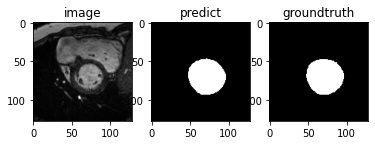

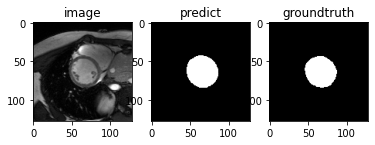

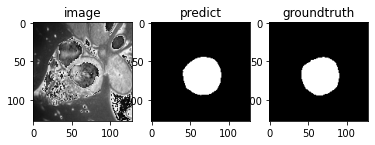

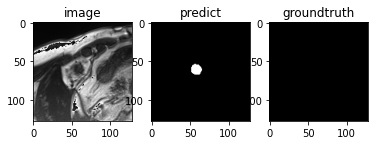

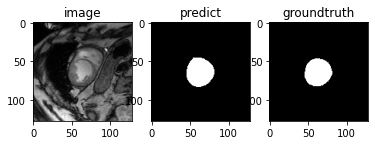

...

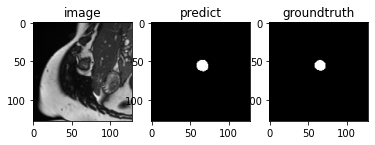

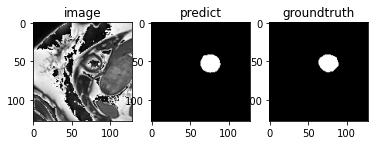

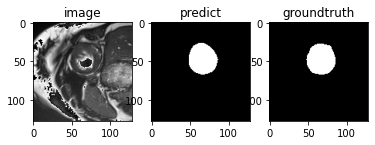

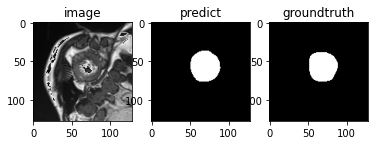

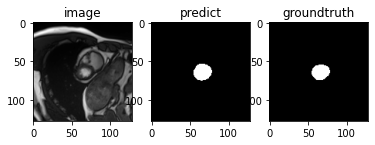

In [ ]:
for i in range(x_test.shape[0]):
  #y_pred = nhat.model(normalize(x_test[i:i+1],y_test[i:i+1]))
  y_pred = model(x_test[i:i+1])
  #y_predShow = np.argmax(y_pred,axis = -1)
  plt.figure(i+1)
  plt.subplot(131),plt.imshow(x_test[i,...,0],cmap ='gray'),plt.title('image')
  plt.subplot(132),plt.imshow(y_pred[0,...,0],cmap ='gray'),plt.title('predict')
  plt.subplot(133),plt.imshow(y_test[i,...,0],cmap='gray'),plt.title('groundtruth')
  plt.show()

**Đồ thị hàm dice_loss và dice_index qua các iteration**

In [ ]:
plt.figure(1)
plt.plot(test_loss, 'b-')
plt.plot(train_loss,'r-')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.figure(2)
plt.plot(train_dice, 'r-')
plt.plot(test_dice, 'b-')
plt.xlabel('iteration')
plt.ylabel('dice coefficient')
plt.show()

In [ ]:
test_loss_k, test_dice_k, test_jaccard_k = model.evaluate(x_test, y_test)

In [ ]:
print('test loss:', test_loss_k)
print('test jaccard:', test_jaccard_k)
print('test dice coefficient:', test_dice_k)

**Muốn lưu hoặc load 1 bộ weight vào google drive cần tạo lại một PyDrive**

In [ ]:
#tạo lại một PyDrive Client để kết nối với Google drive 
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
#lưu và upload weight lên driver vừa khởi tạo
model.save_weights('cardiac_segment_sunnybrook_upgrade4_weights.h5')
weights_file = drive.CreateFile({'title' : 'cardiac_segment_sunnybrook_upgrade4_weights.h5'})
weights_file.SetContentFile('cardiac_segment_sunnybrook_upgrade4_weights.h5')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1_x-4mE4DrztW0qHDSXX8Hz2RnSLxOeA_'})

In [ ]:
#load các weight trên google dive vào mô hình
#link = 'https://drive.google.com/open?id=1N5k_PjvoRzXMQwyZDr50dt9LzlFjTnMv'    #vuptran weights
link = 'https://drive.google.com/open?id=1g4xlWu5mqgMn0Bkr7Bh_o0oE2n37tRHs'    #weights 
fluff, id = link.split('=')
last_weight_file = drive.CreateFile({'id': id}) 
last_weight_file.GetContentFile('last_weights.mat')
model.load_weights('last_weights.mat')

W0625 02:15:23.126481 140572457707392 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

